# **00. 준비단계 및 라이브러리 임포팅**


본 코드는 Python으로 PBM(phase based video magnification) 구현한 것입니다.
기본적으로 사용되는 모듈들은 다음과 같습니다.


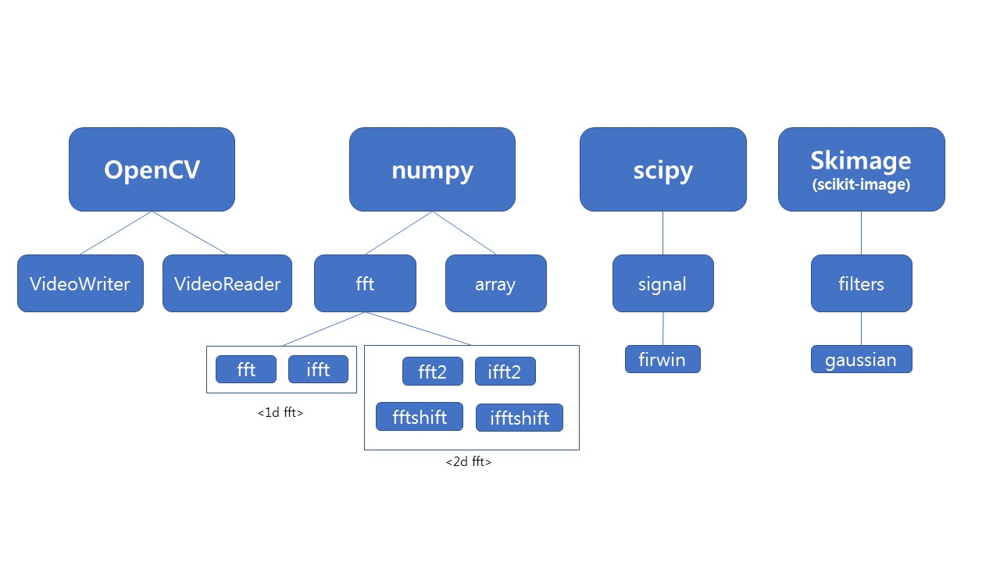

*    **opencv-python(cv2)**: 이미지 및 동영상을 처리하는 데 활용되는 OpenCV 입니다. 이미지를 불러와 자료형(배열)으로 만들고, 이에 다양한 연산을 수행하는 데 도움을 줍니다.
*   **numpy**: Python으로 선형대수학 연산을 활 때 널리 사용되는 모듈입니다. 이미지가 3차원 행렬에 해당되므로 이를 빠르고 간편하게 계산하는 데 array에 포함되어있는 함수들을 활용하며, PBM에 가장 중요하게 활용되는 FFT관련 함수들이 들어있습니다.



 위 OpenCV와 numpy외에도, 다음과 같은 모듈의 함수도 활용됩니다.



*   **scipy.signal.firwin**: 신호처리에서 사용되는 윈도우 함수 중, FIR window를 구현하기 위해 사용합니다.
*   **skimage.filters.gaussian**: xy 도메인 이미지에 FFT를 수행하여 얻은 데이터로부터, 방향성을 파악하기 위해 사용되는 2차원 가우시안 필터를 형성합니다.


이 외에도, 걸리는 시간 측정을 위해 **time**, 팩토리알 등의 수학정 정의들을 활용하기 위해 **math** 라이브러리를 사용하기도 합니다.

In [1]:
# Importing modules

import cv2
from numpy.fft import fft2, fftshift, ifft2, ifftshift
from numpy.fft import fft, ifft
from numpy import tile, real, min, zeros
import numpy as np

from scipy.signal import firwin
from skimage.filters import gaussian

import math
import time

M_PI = math.pi
eps = 2**(-52)

# **01. Parameter Initializing**

제일 처음으로 해주어야 할 일은 확대처리할 영상을 지정해주고, PBM에 활용되는 패러미터들을 설정해주는 일입니다. 다음과 같은 패러미터들이 사용됩니다.


*   **Low_Freq**: 하한 주파수
*   **High_Freq**: 상한 주파수
*   **Sampling_Rate**: 영상을 촬영한 카메라의 샘플레이트 (resolution)
*   **alpha**: 증폭 수치 (알파 값)


Low_Freq와 High_Freq 사이의 주파수 대역이 관찰하고자 하는 대상이 됩니다. Video Magnification은 동영상에서 설정된 주파수 대역에 해당되는 진동을 alpha 값만큼 증폭시켜서 나타냅니다.


그 외에 PBM 코드에서 자체적으로 사용되는 튜닝 값들에 대한 간단한 설명입니다.
*   **refFrame**: 진동을 계산할 때 기준을 잡을 프레임(이미지)의 인덱싱 넘버입니다. 일반적으로 영상의 가장 처음 한 컷을 기준으로 픽셀의 움직임이 어떻게 나타나는지를 바탕으로 진동을 측정하기 때문에 0으로 둡니다. 
*   **NumOfPyramid**: Gaussian Pyramid를 얼마나 형성할지 설정해줍니다. Gaussian Pyramid는 영상의 축소 및 확대에 사용되는 보간법인데, PBM에서는 확대처리 후 영상과 원본 영상 간의 괴리감을 줄이기 위해 활용됩니다. 
*   **Orientation**: 영상에서 검출할 진동의 방향좌표를 설정합니다. 기본은 2축으로 x, y 2방향에 해당되는 진동을 검출합니다. 2가 아닌 4로 설정할 경우 x, y축을 45도 회전시킨 방향성에 대해서도 추가적으로 검출합니다.
*   **Sigma**: 작성 마저 해야함.
*   **attenuateOtherFreq**: 작성 마저 해야함.


In [2]:
#확대처리 대상 설정
videoName = 'cantilever (2200fps)' #대상 비디오 파일명
videoType = '.mp4' #확장자
fourcc = cv2.VideoWriter_fourcc(*'mp4v') #확대과정 후 저장시 mp4로 저장

#Parameter Initializing
Low_Freq = 350
High_Freq = 370
alpha = 5
Sampling_Rate = 2200

refFrame = 0
NumberOfPyramid = 2
Orientation = 2
sigma = 1
attenuateOtherFreq = 0 # 영역 외 주파수에 대해 베재할 것인가에 대해 True or False

# **02. Video Importing, Information Checking**

앞서 지정해둔 비디오 파일을 객체형태로 불러와 영상의 기본적인 정보들을 추출하는 과정입니다.



OpenCV에서는 cap라는 객체에 대상 동영상의 경로를 지정해주고, **ret, frame = cap.read()**라는 형태로 동영상의 한 프레임을 읽어옵니다.

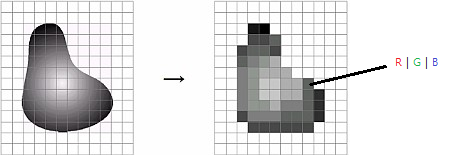

**ret**는 현재 동영상을 계속 읽는 중인지 혹은 다 읽었는지를 판별하는 논리값 (True / False)이며, **frame**은 해당 프레임을 8bit RGB이미지에서 3차원 배열로 변환해 객체로 표현합니다.

이에 따라 **frameX, frameY, nColor**는 각각 동영상의 너비(width), 높이(height), 이미지의 컬러 채널 개수를 의미합니다.

또한, **nFrame**은 이러한 **frame**이 총 몇장 있는지 나타냅니다.

In [3]:
#Video File Importing
fileName = './input/{}{}'.format(videoName, videoType)
cap_original = cv2.VideoCapture(fileName)

#Video Information Checking
ret, frame = cap_original.read()
frameX = frame.shape[1]
frameY = frame.shape[0]
nColor = frame.shape[2]
nFrame = int(cap_original.get(cv2.CAP_PROP_FRAME_COUNT))

# **03. Create Steerable Filter**

위에서 이미지를 2차원 배열의 형태로 가져옴에 따라, 우리는 이미지를 하나의 신호로 생각할 수 있습니다. 이러한 발상으로 접근하기 위해 간단한 예를 설명하도록 하겠습니다.

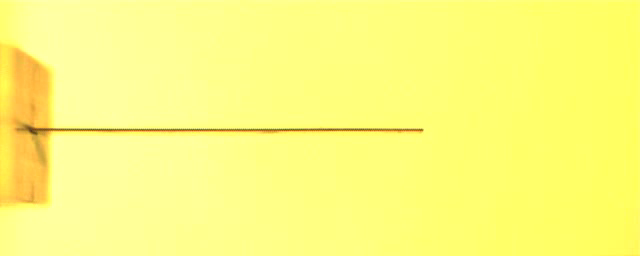
![%28%EB%B0%B0%EC%A0%95%EB%B0%80%EB%8F%84%29%20350~370,%20a=5%20shortest_2nd_2200fps%20(shortened%20to%20300fr).mp4_000000633.png](attachment:%28%EB%B0%B0%EC%A0%95%EB%B0%80%EB%8F%84%29%20350~370,%20a=5%20shortest_2nd_2200fps%20(shortened%20to%20300fr).mp4_000000633.png)
예를들면 위와 같은 컬러 이미지는 아래의 회색조(gray scale) 이미지로 바꾸어 나타낼 수 있습니다.

컬러 이미지는 일반적으로 3차원 배열로 표현하지만, 색상정보들을 따로 표시하지 않고 명암에 대해서만 나타낸 회색조 영상의 경우, 2차원 배열로 표현할 수 있습니다. 이 2차원 배열을 mesh 형태로 표현하면 다음과 같습니다. 

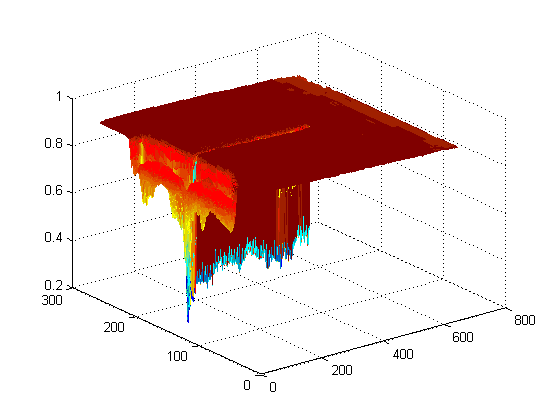
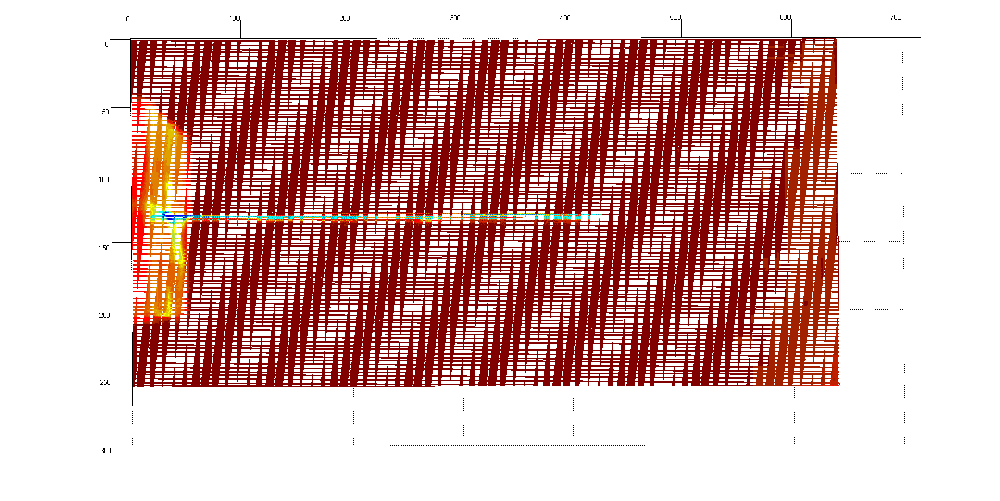
위는 일반적인 복잡한 mesh의 형태로 보이지만, 각도를 잘 조정해 위에서 아래로 내려다보는 위치에서는 위의 캔틸레버 이미지인 것을 알 수가 있습니다. 빨간색이 255(흰색)에 가까운 값, 파란색이 0(검은색)에 가까운 값이며 화면크기인 256x640의 각 픽셀에 밝기 값들이 각기 다르게 저장되어있는 것입니다.


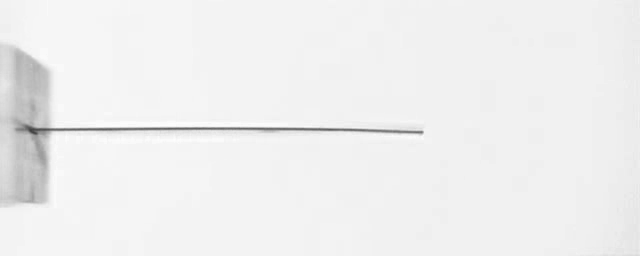

여기서 이 mesh의 heigt가 128인 지점에 대해, 640개의 값들을 plot하면 다음과 같습니다.

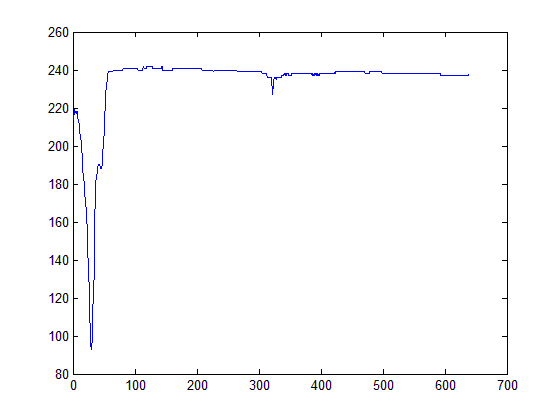

이처럼 heigt에 해당하는 축을 고정해두고, width를 따라서 pixel의 밝기 값을 나열하면 하나의 1차원 이산 신호 데이터라고 생각할 수 있습니다. height이 128인 지점이 아니라 0~255인 지점 모두에 대해서 이러한 plot을 얻을 수 있으며, 반대로 width에 한 축을 고정해두고 height의 값들을 나열해 plot을 얻을 수도 있습니다. 음성이나 신호는 1차원 신호이지만, 이미지는 2차원 신호데이터라고 생각할 수 있는 것입니다.

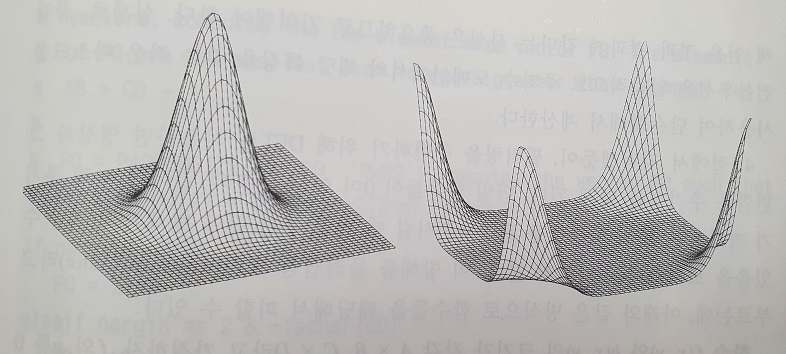

이미지를 신호데이터라고 생각한다면 이미지에 대해서도 푸리에변환을 적용할 수 있습니다. 다만 음성이나 신호와 같은 1차원 데이터와는 달리 축이 두 개이므로, 실제로 푸리에변환을 수행하게 되면 주파수 영역 이미지의 제일 가장자리 부분이 두드러지게 높은 값을 나타냅니다. (아랫쪽 이미지) 하지만 우리가 얻은 주파수 영역의 이미지는 640x256의 범주를 넘어설 경우 새로운 데이터가 있는 것이 아니라, 기존의 값들이 무한히 반복된다고 가정하므로 주파수 영역의 이미지를 평행이동하여 가운데로 특성값을 모은 형태를 얻습니다.(윗쪽 이미지)

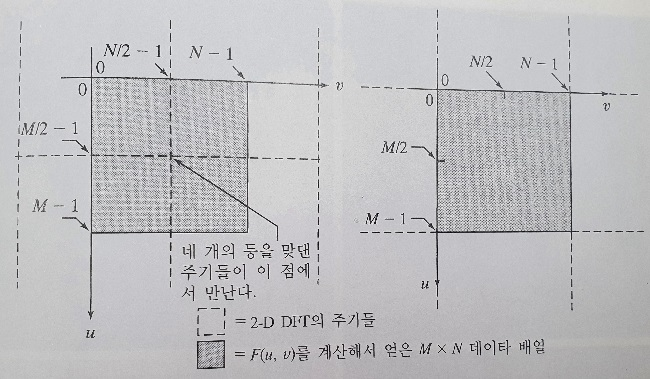

**fft2**가 이미지를 순수하게 2차원 푸리에변환을 통해 주파수 영역 이미지를 얻는 기능이라면, **fftshift**는 이 이미지를 평행 이동하여 이미지의 극에 있던 값들을 가운데로 모이게 해주는 역할을 합니다. 일반적으로 이미지프로세싱에서 FFT된 스펙트럼으로 소개되는 이미지들은, fft2 후 fftshift까지 거친 영상들이 대부분이며, 이미지에 대한 필터 및 다른 알고리즘도 대부분 이 두 과정을 거쳤다는 전제 하에 진행됩니다.



이처럼 2차원 FFT를 거친 영상은 하나의 좌표평면으로 생각할 수 있으며, 원점에 가까울수록 저주파 영역, 외곽에 가까울수록 고주파영역에 해당된다고 생각할 수 있습니다. 1차원 신호에서 low pass filter와 high pass filter를 통해 주파수 대역을 잘라내듯이, 이미지도 이러한 신호처리와 같은 접근법을 적용할 수 있습니다.
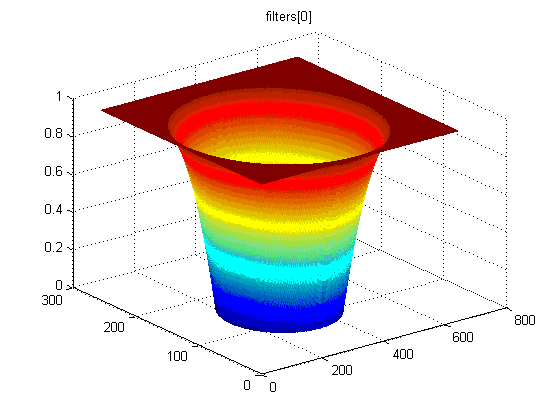
FFT로 얻은 주파수 영역 이미지에 위의 메쉬와 같은 filter를 컨볼루션할 경우, 외곽(고주파 영역)은 1이 곱해지므로 그대로 남지만 가운데로 올수록 가중치가 떨어지면서 한 가운데(저주파 영역)에는 0에 가까운 값들이 곱해집니다. 이처럼 가운데가 움푹 들어가있는 형태는 high pass filter이며, 이를 거꾸로 뒤집으면 low pass filter가 되는 것입니다. filter는 mesh를 만드는 방식이나 경사 등에 따라 위의 메쉬 외에도 다양한 형태가 존재할 수 있습니다. 

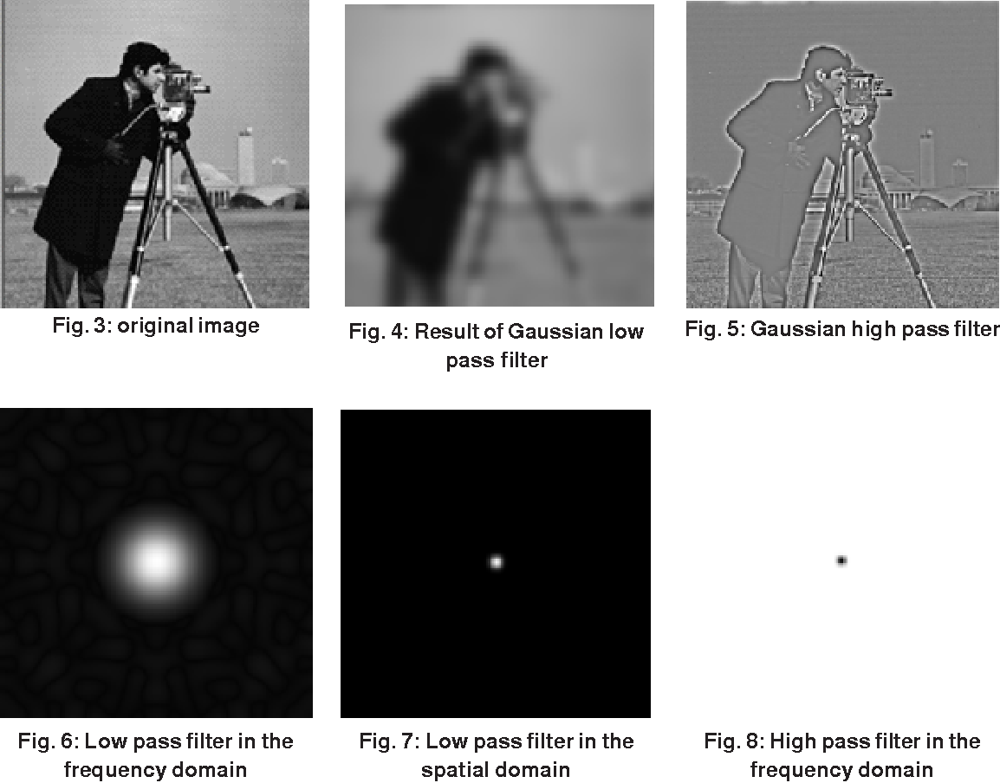
위의 사진은 이러한 filter를 이용해 이미지 처리를 한 예시입니다. Low pass filter의 경우 사진의 윤곽선이 흐릿해진 대신 물체의 색상은 그대로 유지되어 있는 한 편, high pass filter는 윤곽선이 뚜렷해진 대신 물체의 색상은 거의 남지 않았습니다.




멈춰있는 사진들에 대해서는 위와 같이 filter를 적용하여 특수한 처리 효과를 얻을 수 있습니다. PBM에서는 이러한 필터들 중 아래와 같은 **steerable filter**라는 특별한 필터를 사용합니다.
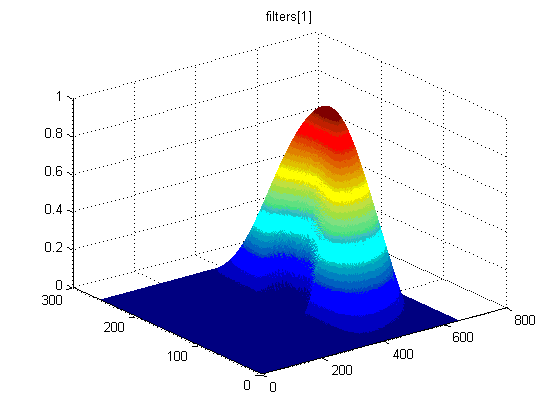

 **steerable filter**는 일종의 band pass filter이지만, 완전한 원형이 아니라 반원 영역으로만 나타납니다. 실제 동영상이 width방향, 혹은 height 방향으로 흔들린다고 할 때, 이 영상들의 장면을 FFT 하여 나열하면 주파수 영역에서도 몇몇 u,v 위치의 특이점들이 진동하는 양상을 볼 수 있습니다. 즉, video magnification을 통해 얻은 확대영상과 원본간의 자연스러운 합성과 동시에, 영상의 방향성을 파악하기 위해 이와 같은 필터를 사용하는 것입니다.

In [4]:
pyrLayers = 2
rVals = [1]
for i in range(pyrLayers):
    rVals.append(0.5**(i+1))


PBM에서 후처리 영상과 원본 영상 간의 괴리감을 줄이기 위해, FFT를 수행한 뒤 한 번만 확대처리하는 것이 아니라, 주파수영역 이미지 상 가운데에로 가까워 질 수록 가중치를 주게 됩니다. 예를들어 400x400영상을 FFT 하여 확대처리를 할 경우, 전체 400x400 영역에서 가운데의 200x200, 100x100...와 같이 절반씩 줄여가며 가중치를 부여해 나갑니다. **pyLayers**는 그 가중치를 얼마만큼 줄지 표현하는 수치입니다. 본 코드에서는 **pyLayers = 2**로 두었으므로, FFT된 이미지의 1/2, 1/4까지만 집약적으로 가중치를 두겠다는 의미입니다. **rVals**는 원본비율(1)을 포함한 배열 [1, 1/2, 1/4]가 됩니다.

In [5]:
# 아래 극좌표와 원뿔대 형성 함수를 바탕으로 steerable filter를 형성한다.
def getFilters(dimension, rVals, orientations):
    X = int(dimension[1])
    Y = int(dimension[0])

    defaultTwidth = 1
    twidth = defaultTwidth

    polarGrid = getPolarGrid(dimension)
    count = 0

    angle = np.array(polarGrid[0]) #픽셀 위치별 각도 값
    rad = np.array(polarGrid[1]) #픽셀 위치별 거리 값

    mask = getRadialMaskPair(rVals[0], rad, twidth)
    himask = mask[0]
    lomaskPrev = mask[1]

    filters = []
    filters.append(himask)

    for k in range(1, len(rVals)):
        mask = getRadialMaskPair(rVals[k], rad, twidth)
        himask = mask[0]
        lomask = mask[1]

        radMask = himask*lomaskPrev

        for j in range(1, orientations+1):
            angleMask = getAngleMask(j, orientations, angle)
            filters.append(radMask*angleMask/2)

        lomaskPrev = lomask
    filters.append(lomask)

    for k in range(len(filters)):
        filters[k] = np.array(filters[k])
    return filters

#화면의 너비x높이 크기의 극좌표르를 2차원 배열으로 형성한다.
def getPolarGrid(dimension):
    X = dimension[1]
    Y = dimension[0]
    centerX = int(X / 2)
    centerY = int(Y / 2)

    # Create rectangular grid
    xramp = np.array([ [(x-int(X/2))/(X/2) for x in range(X)] for y in range(Y)])
    yramp = np.array([ [(y-int(Y/2))/(Y/2) for x in range(X)] for y in range(Y)])
    angle = np.arctan2(xramp, yramp)+M_PI/2

    rad = np.sqrt(xramp**2+yramp**2)
    rad[centerY][centerX] = rad[centerY-1][centerX]

    polarGrid = [angle, rad]
    return polarGrid

#3차원 그래프상으로 보이는 완전 꼬깔 형태에서, 위 아래의 범위를 잘라내고 원뿔대 같은 형태도 만든다.
def getRadialMaskPair(r, rad, twidth): 
    X = int(rad.shape[1])
    Y = int(rad.shape[0])

    log_rad = np.log2(rad)-np.log2(r)

    himask = log_rad
    himask[himask>0] = 0
    himask[himask<-twidth] = -twidth
    himask = himask*M_PI/(2*twidth)

    himask = np.cos(himask)
    lomask = np.sqrt(1-himask**2)

    mask = [himask, lomask]
    return mask

def getAngleMask(b, orientations, angle):
    order = orientations - 1
    const = (2 ** (2 * order)) * (math.factorial(order) ** 2) / (orientations * math.factorial(2 * order)) # Scaling constant

    angle_ = (M_PI + angle - (M_PI * (b - 1) / orientations)) % (2 * M_PI) - M_PI
    anglemask = 2 * np.sqrt(const) * (np.cos(angle_) ** order) * (abs(angle_) < (M_PI / 2))  # Make falloff smooth
    return anglemask

filters = getFilters([frameY, frameX], rVals, Orientation)

**getFilters**는 **Orientation**으로 지정한 검출하고자 하는 방향 축 갯수와 **rVals**로 지정한 가중치 비율만큼의 steerable filter를 형성하는 함수입니다. 이 과정에서 다음과 같은 함수들이 사용됩니다.

*    **getPolarGrid**: 너비, 높이 값을 받아 너비x높이 크기의 극좌표르를 2차원 배열으로 형성합니다.
*    **getRadialMaskPair**:  배열 내의 임의의 상한 값 이상의 값들은 상한값으로, 하한 값 이하의 값들은 하한 값으로 잘라내는 역할을 합니다. 3d gaussian function은 원뿔대와 유사한 형상을 가지고 있는데, 이 과정에 의해서 위 아래가 잘려나가 원뿔대와 비슷한 형상이 됩니다.

현재 **Orientation** = 2, **rVals** = [1, 1/2, 1/4]이므로 **filters는** 2차원 배열 총6개를 성분으로 가지는 리스트가 됩니다. 각 리스트의 성분은 다음과 같습니다.

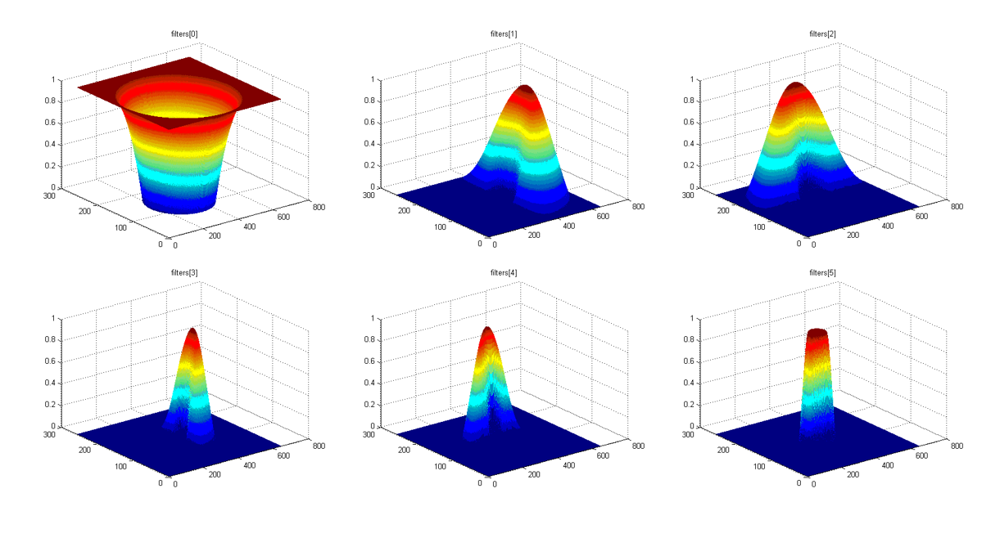

*    **filters[0]**: getRadialMaskPair로 의해 형성된 원본 화면 크기의 high pass filter
*    **filters[1]**: 원본 화면의 1/2 크기 y (height: 높이) 방향 steerable filter
*    **filters[2]**: 원본 화면의 1/2 크기 x (width: 너비) 방향 steerable filter
*    **filters[3]**: 원본 화면의 1/4 크기 y (height: 높이) 방향 steerable filter
*    **filters[4]**: 원본 화면의 1/4 크기 x (width: 너비) 방향 steerable filter
*    **filters[5]**: getRadialMaskPair로 의해 형성된 1/4 화면 크기의 low pass filter

그러나 filters의 성분들은 3차원 영역의 모습은 축소되었지만, 실제 크기는 원본 화면 크기 그대로입니다. (실질적으로 솟아오른 filter 부분 외곽의 0인 값의 영역이 남아 있습니다.) 따라서 아래의 과정을 통해 필요 없는 영역을 잘라냅니다.

In [6]:
def getFilterIDX2(filters, orientations, rVals):
    X = filters[0].shape[1]
    Y = filters[0].shape[0]
    nFilts = len(filters)
    filtIDX = [[None for j in range(orientations)] for i in range(nFilts)]
    croppedFilters = []

    #himask IDX
    filtIDX[0][0] = [y for y in range(Y)]
    filtIDX[0][1] = [x for x in range(X)]
    croppedFilters.append(filters[0])

    #stearable filter IDX
    for k in range(1, nFilts-1, orientations):
        n = int(k/2)+1
        lb_y = int( (Y*(sum(rVals[0:n])-1))/2 )
        ub_y = Y - lb_y
        lb_x = int( (X*(sum(rVals[0:n])-1))/2 )
        ub_x = X - lb_x

        for i in range(orientations):
            filtIDX[k+i][0] = [y + lb_y for y in range(ub_y - lb_y)]
            filtIDX[k+i][1] = [x + lb_x for x in range(ub_x - lb_x)]

        for i in range(orientations):
            croppedFilters.append(filters[k+i][lb_y:ub_y, lb_x:ub_x])


    #lomaskIDX
    lb_y = int( (Y * (sum(rVals) - 1))/2 )
    ub_y = Y - lb_y
    lb_x = int( (X * (sum(rVals) - 1))/2 )
    ub_x = X - lb_x


    filtIDX[nFilts - 1][0] = [y + lb_y for y in range(ub_y - lb_y)]
    filtIDX[nFilts - 1][1] = [x + lb_x for x in range(ub_x - lb_x)]
    croppedFilters.append(filters[nFilts-1][lb_y:ub_y, lb_x:ub_x])

    filterIDX = [croppedFilters, filtIDX]
    return filterIDX


filterIDX = getFilterIDX2(filters, Orientation, rVals)
croppedFilters = filterIDX[0]
filtIDX = filterIDX[1]

결과적으로 **croppedFilters**와 **filtIDX**가 남습니다. **croppedFilters**는 위의 **filters**에서 **rVals**의 비율에 맞게 외곽의 값이 0인 부분을 잘라낸 것이며, **filtIDX**는 x축과 y축을 표현한 것으로 [0, 1, 2, ... , x-1], [0, 1, 2, ... , y-1] 2개 성분을 가지는 리스트입니다.

# **04. Spatial Fourier Transform (2D Fourier Transform)**

사진과 같은 2차원 데이터를 FT하는 것을 **Spatial Fourier Transform**이라고도 합니다. 위에서 언급한 것처럼, 이미지는 일반적으로 3차원 배열로 표현하지만 색상정보들을 따로 표시하지 않고 명암에 대해서만 나타낸 회색조(gray scale) 영상의 경우, 2차원 배열로 표현할 수 있습니다. 회색조 영상으로도 사진 속에서 물체나 형상을 구분할 수 있으며, 2차원 FT를 하기 위해서는 기존의 영상을 회색조 영상으로 바꾸어주어야 합니다. 

회색조 영상은 픽셀 하나에 8bit의 unsigned integer의 값으로 명암을 표시하는데, 0에 가까울수록 흑색, 255에 가까울 수록 백색을 띕니다. 우리가 보는 색상은 RGB로 표현되어 있으며, R, G, B의 값을 일정 비율로 섞어 흑백의 값을 만듭니다. 일반적으로 널리 사용되는 회색조 계산식은 다음과 같습니다.
*    0.299R + 0.587G + 0.114B

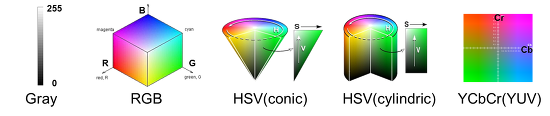
한편, 화면에서 컬러 영상을 표현하는 방식은 RGB이지만, 다른 색 좌표계를 활용하여 컬러 영상을 표현하는 방법도 있습니다. RGB 방식은 R, G, B의 각 색상이 얼마만큼 비중있게 차지하는지를 표현하지만, 몇몇 색 좌표계들은 화면의 명암과 색상 정보를 따로 저장하는 방식으로 저장합니다. **HSV**의 경우, H(Hue)는 색상, S(Saturation)은 채도, V(Value)는 명암의 값을 가집니다. 가령 RGB 영상을 HSV 형태로 변환 한 뒤, 명암에 해당되는 V 값에 대해서만 2차원 FT를 수행해준 후, 다시 원본의 H, S값과 조합하는 것으로 컬러 영상을 복원할 수 있습니다.

그러나 HSV의 색좌표계의 S값은 '탁한 정도'를 표현하는 값이므로, V값과 밀접한 연관성이 있습니다. 이 때문에 단순히 V 값에 대해서만 2차원 FT를 수행하면 굉장히 부자연스러운 결과물이 나옵니다. 따라서 HSV 외의 밝기 값을 따로 저장하는 색좌표이되, S 값과 같이 명암에 영향을 주는 값 없이 색상만을 표현한 좌표계가 요구됩니다. 그 중 하나가 바로 **YIQ** 색좌표계입니다.

In [7]:
def bgr2yiq(img):
    R = img[:, :, 2]
    G = img[:, :, 1]
    B = img[:, :, 0]

    Y = 0.299 * R + 0.587 * G + 0.114 * B
    I = 0.596 * R - 0.274 * G - 0.322 * B
    Q = 0.211 * R - 0.523 * G + 0.312 * B

    img_yiq = np.zeros([img.shape[0], img.shape[1], img.shape[2]])
    img_yiq[:, :, 0] = Y
    img_yiq[:, :, 1] = I
    img_yiq[:, :, 2] = Q
    #YIQ = np.array([[0.299, 0.587, 0.114],[0.596, -0.274, -0.322],[0.211, -0.523, 0.312]])
    return img_yiq

def yiq2bgr(img):
    Y = img[:, :, 0]
    I = img[:, :, 1]
    Q = img[:, :, 2]

    R = Y+0.956*I+0.621*Q
    G = Y-0.272*I-0.647*Q
    B = Y-1.106*I+1.703*Q

    img_rgb = np.zeros([img.shape[0], img.shape[1], img.shape[2]])
    img_rgb[:, :, 0] = B
    img_rgb[:, :, 1] = G
    img_rgb[:, :, 2] = R
    #YIQ = np.array([[0.299, 0.587, 0.114],[0.596, -0.274, -0.322],[0.211, -0.523, 0.312]])
    return img_rgb

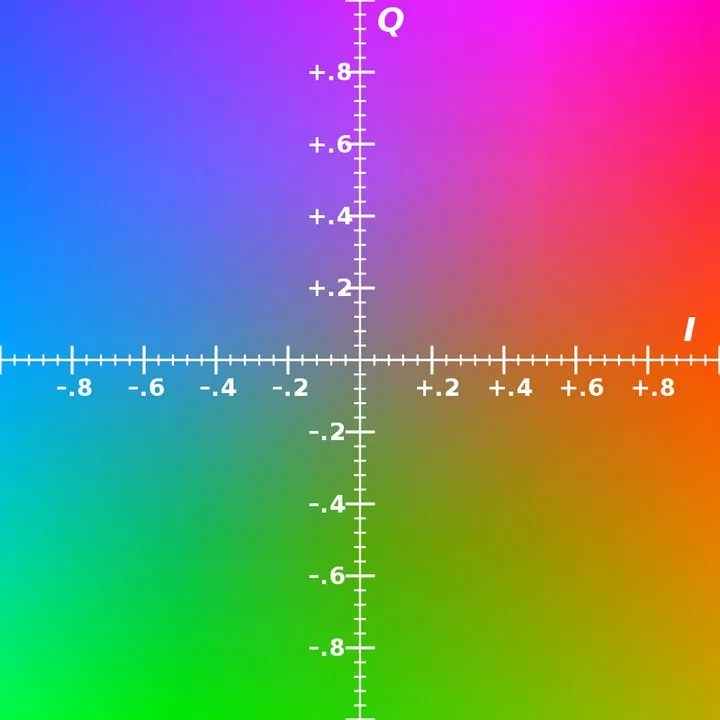
NTSC라고도 하는 YIQ 색좌표계는 Y에 명암 값을 저장하며, I와 Q를 통해 색상들을 표현합니다. 즉 명암에 영향을 받는 값은 Y뿐이므로, Y값만을 이용해 2차원 FT를 해주면 확대처리된 컬러 영상을 얻을 수 있습니다. 정리하자면 아래와 같은 절차로 진행됩니다.

1. 원본 RGB 영상을 YIQ 색좌표 형태로 바꾼다.
2. YIQ에서 Y값만을 가져와 2차원 FT를 하고 영상촥대처리를 수행한다. 이로써 회색조의 확대처리 영상을 얻을 수 있다
3. 처리된 Y값과 기존의 I, Q 값을 합쳐 확대처리된 YIQ 영상을 만든다.
4. 이를 다시 RGB로 역변환하면 우리가 볼 수 있는 비디오 형태로 변환된다.

OpenCV에서는 YIQ 색좌표 관련 함수는 지원하지 않습니다. 다행히도 대부분의 색좌표 변환은 기존의 RGB 값의 선형합으로 표현되므로, 직접 구현하는 데 큰 어려움이 없습니다. 본 코드에서는 위의 **bgr2yiq**, **yiq2bgr**를 활용합니다. 이 함수들은 MATLAB에서 제공하는 rgb2ntsc, ntsc2rgb를 참고하여 만들었으며, rgb가 아니라 bgr인 이유는 OpenCV의 임포팅 함수들이 bgr 순으로 영상을 읽어오기 때문입니다.

In [8]:
vidFFT = np.zeros([nFrame,frameY,frameX], dtype=np.complex64)

for k in range(0, nFrame):
    clipMat = frame/255
    tVid = bgr2yiq(clipMat)[:,:,0]
    vidFFT[k] = fftshift(fft2(tVid))
    ret, frame = cap_original.read()

cap_original.release()

**vidFFT**는 원본 RGB영상을 YIQ좌표로 바꾼 뒤, 명암에 해당되는 Y값만을 가져와서 2차원 fft를 수행합니다. 위 코드에서 tVid는 한 프레임의 Y값에 해당하는 2차원 배열이며, 우선 **fft2**로 2차원 푸리에변환 데이터를 얻은 뒤 **fftshift**를 통해 외곽과 가운데를 반전시켜줍니다. 위에서 설명하였듯, 외곽으로 높은 값(흰색)이 나타나는 경향성 때문에 2차원 FT에서는 항상 이러한 shifting작업이 병행됩니다.

In [9]:
def fir_window_bp_2(delta, fl, fh):
    length = delta.shape[0]+1
    b = firwin(length, (fl * 2, fh * 2), pass_zero=False)[0:length-1]

    m = delta.shape[1]
    batches = 20
    batch_size = int(m / batches) + 1
    temp = fft(ifftshift(b))
    out = zeros(delta.shape, dtype=delta.dtype)

    i=0
    indexes = (batch_size * i, min((batch_size * (i + 1), m)))
    while (indexes[0]<m):
        indexes = (batch_size * i, min((batch_size * (i + 1), m)))
        freq = fft(delta[:, indexes[0]:indexes[1]], axis=0) * tile(temp, (
            delta.shape[2], indexes[1] - indexes[0], 1)).swapaxes(0, 2)
        out[:, indexes[0]:indexes[1]] = real(ifft(freq, axis=0))
        i += 1
        indexes = (batch_size * i, min((batch_size * (i + 1), m)))
    return out

def amplitude_weighted_blur(x, weight, sigma):
    if sigma != 0:
        return gaussian(x*weight, sigma, mode="wrap") / gaussian(weight, sigma, mode="wrap")
    return x

magnifiedLumaFFT = np.zeros([nFrame, frameY, frameX], dtype=np.complex64)
numLevels = len(filters)

**fir_window_bp_2**는 해밍 윈도우 중 하나인 **FIR window**윈도우를 적용해 **LowFreq**와 **HighFreq** 사이 대역의 성분을 검출해냅니다. 이미지에 대해서 width와 height 도메인에서의 2차원 신호에 대한 접근과 별개로, 동영상은 한 장의 프레임 여러개가 나열되어있는 형태이고, 영상에서의 움직임에 따라 한 픽셀에서의 값은 계속해서 바뀝니다. 이러한 픽셀값의 변화 추이를 1차원 FFT를 통해 감지하게 되는데, 본 코드에서는 해밍 윈도우를 씌우고 FFT를 진행하는 일련의 과정 자체를 **fir_window_bp_2**라는 함수로 통합한 것입니다. **amplitude_weighted_blur**는 확대처리된 데이터와 원본을 병합하는 과정에 있어 위화감을 축소하고자 사용는 함수입니다. 본 예제에서는 활용하지 않았습니다.

**magnifiedLumaFFT**는 2차원 FFT를 거쳐 변화된(magnified) 밝기값(Luma)을 의미합니다. 총프레임수x높이x너비 형태의 3차원 배열이며, 여기에 **steerable filter**를 거친 주파수 이미지에 여러가지 처리를 한 다음 누적시킵니다.

In [10]:
for level in range(1, numLevels-1):
    X = len(croppedFilters[level][0])
    Y = len(croppedFilters[level])
    lb_x = filtIDX[level][1][0]
    ub_x = filtIDX[level][1][-1]+1
    lb_y = filtIDX[level][0][0]
    ub_y = filtIDX[level][0][-1]+1

    # 1. 기준프레임 설정
    clipMat = croppedFilters[level] * vidFFT[refFrame][lb_y:ub_y, lb_x:ub_x]
    pyrRef = ifft2(ifftshift(clipMat))
    pyrRefPhaseOrig = pyrRef / abs(pyrRef)
    pyrRef = np.angle(pyrRef)

    delta = np.zeros([nFrame,Y,X], dtype=np.float16)
    matCheck = []
    
    # 2. 각 프레임간 차이 계산
    for frameIDX in range(0, nFrame):
        filterResponse = ifft2(ifftshift( croppedFilters[level] * vidFFT[frameIDX][lb_y:ub_y, lb_x:ub_x] ))
        pyrCurrent = np.angle(filterResponse)
        clipMat1 = pyrCurrent - pyrRef
        clipMat2 = M_PI + clipMat1
        clipMat3 = clipMat2%(2*M_PI)
        clipMat4 = clipMat3 - M_PI
        clipMat = clipMat4
        delta[frameIDX] = clipMat

    # 3. 픽셀 변화 양상에 대한 band pass filtering
    delta_1 = fir_window_bp_2(delta, Low_Freq / Sampling_Rate, High_Freq / Sampling_Rate)  # Finite Impulse Response filter

    for frameIDX in range(0, nFrame):
        Phase = delta_1[frameIDX]

        originalLevel = ifft2(ifftshift(croppedFilters[level]*vidFFT[frameIDX][lb_y:ub_y, lb_x:ub_x]))

        if (sigma != 0):
            Phase = amplitude_weighted_blur(Phase, abs(originalLevel)+eps, sigma)
        
        # 4. alpha 계수 곱 및 병합
        Phase = alpha*Phase

        if (attenuateOtherFreq):
            tempOrig = abs(originalLevel)*pyrRefPhaseOrig
        else:
            tempOrig = originalLevel

        tempTransformOut = np.exp(1j*Phase)*tempOrig


        A = croppedFilters[level]
        B = fftshift(fft2(tempTransformOut))
        curLevelFrame = 2 * A * B

        matClip = magnifiedLumaFFT[frameIDX][lb_y:ub_y, lb_x:ub_x]
        magnifiedLumaFFT[frameIDX][lb_y:ub_y, lb_x:ub_x] = matClip + curLevelFrame

#5. lowpass residual 처리
level = len(filters)-1
lb_x = filtIDX[level][1][0]
ub_x = filtIDX[level][1][-1] + 1
lb_y = filtIDX[level][0][0]
ub_y = filtIDX[level][0][-1] + 1
for frameIDX in range(0, nFrame):
    lowpassFrame = vidFFT[frameIDX][lb_y:ub_y, lb_x:ub_x]*(croppedFilters[level]**2)
    matClip = magnifiedLumaFFT[frameIDX][lb_y:ub_y, lb_x:ub_x] + lowpassFrame
    magnifiedLumaFFT[frameIDX][lb_y:ub_y, lb_x:ub_x] = matClip

위의 핵심적인 알고리즘의 설명은, 구체적으로 식을 작성하기 복잡하므로 과정을 하나씩 짚어가며, 백그라운드에선 어떠한 방식으로 진행되는지 들여다보도록 하겠습니다.

0.    **PBM의 콘셉트**: 들어가기에 앞서, PBM(Phase Based Video Magnification)이 이러한 이름을 가지게 된 이유에 대해서 설명하겠습니다. phase는 이미지를 FT했을 때 각 픽셀값의 복소수 값의 위상각(phase angle)을 의미하는 것으로, 비쥬얼 데이터 상으로는 복잡한 형상을 보이지만 이미지처리에서 이 위상각은 특별한 의미를 가지고 있습니다.

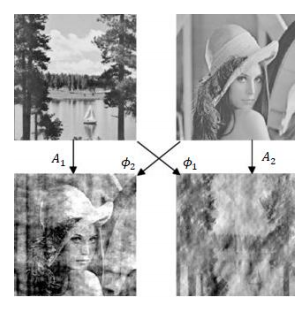

 가령 위와 같이 두 사진을 2차원 FFT를 하게 되면 각 픽셀이 복소수 값으로 바뀌게 되는데, 이 때 각 픽셀의 복소수 절대값을 유지한채 위상각만 서로 바꾼 뒤 다시 역변환하게 되면, 원본의 흔적은 남아있지만 서로 사진이 뒤바뀐 것처럼 나타납니다. 이미지는 신호의 관점에서 **위상이 지배적이다 (phase is dominant than magnitude)** 라고 할 수 있습니다. PBM은 이점에 착안하여 위상각 간의 차이를 응용하기 때문에 Phase Based Magnification이라고 하는 것입니다. 위의 예시는 완전히 다른 두 사진을 이용했지만, 비슷한 사진이 연속적으로 나오는 동영상의 경우, 주파수 영역에서의 절대값은 남아있기에 원본과의 위화감이 크게 줄어든 한 편, 위상이 지배적이라는 특성을 이용해 미소한 진동 요소를 효과적으로 확대할 수 있는 것입니다.

1.    **기준 프레임 처리**: video magnification에는 EVM, PBM 등 여러가지 방법이 있지만, 공통적으로 기준이 되는 한 프레임과 다른 프레임간의 차이에 대해 연산하는 방식으로 진행됩니다. 대부분의 경우는 영상의 가장 첫프레임을 기준 프레임으로 설정하게 됩니다. PBM에서는 이러한 연산이 주파수 영역에서 진행되므로 기준프레임 역시 주파수영역 필터링을 거쳐서 진행됩니다.

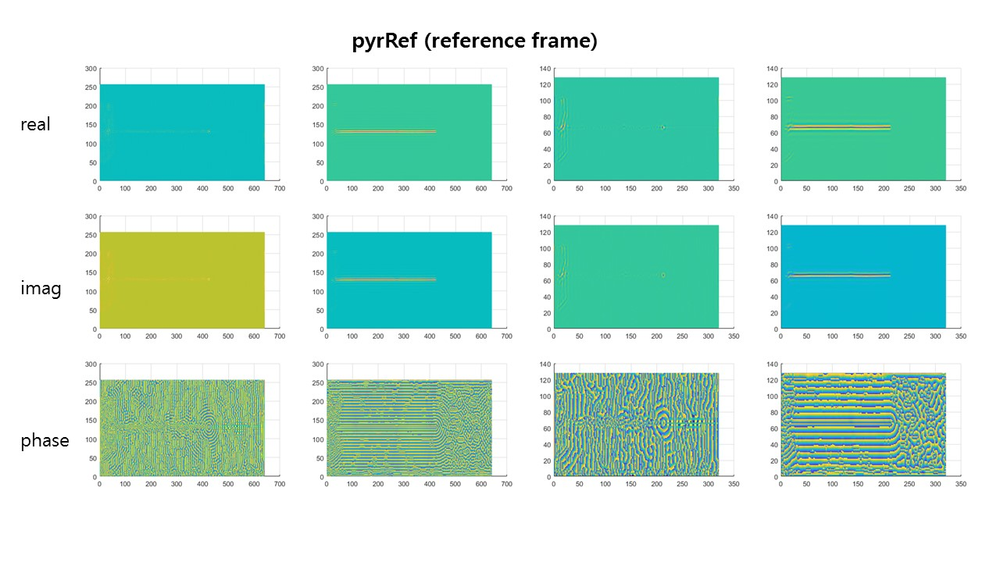

위 사진은 FFT 된 주파수 영역 이미지에 steerable filter를 적용한 후 역변환한 사진입니다. 주파수영역에서의 필터링을 거쳤기 때문에 역변환을 해서 x,y 영역으로 되돌아와도 실수가 아닌 복소수 형태를 가지고 있지만, real과 imag 부분만 가져와서 보면 기존 사진의 형상이 남아있음을 알 수 있습니다. level은 **cropped filter**의 인덱싱넘버 1~4에 해당되며, real과 imag 부분의 이미지 중 x방향 필터인 level 2, 4에서 가로로 뻗어있는 캔틸레버 구조물을 확인할 수 있습니다. 그 아래 phase는 위상각에 해당되는 이미지로, 직관적인 이미지는 아니지만 실제 코드는 해당 값들을 이용해 연산이 진행됩니다.

2.    **각 프레임간의 차이 계산**: 기준 프레임에 대해서 위상각 이미지로 만들었다면, 그 다음에는 다른 프레임들 역시 위상각 이미지로 만든 다음, 기준프레임과의 행렬 뺄셈을 통해 어느 픽셀 부근에서 기준 프레임과는 다른 양상이 나타나는지 지켜볼 것입니다. 이 뺄셈 연산을 통해 얻는 프레임의 모음은 **delta**입니다. **delta**는 위상각 이미지므로 모든 픽셀값은 라디안 각도에 해당되므로 -3.14 ~ 3.14(원주율 파이)이며, 차이값으로 나타난 결과 역시 이 범주에 해당되어야 합니다. 그러나 별다른 제한사항 없이 배열끼리 단순 뺄셈을 하면 데이터는 -6.28~6.28 범주에서 나타납니다. 이는 아래의 데이터를 통해 살펴보도록 하겠습니다.

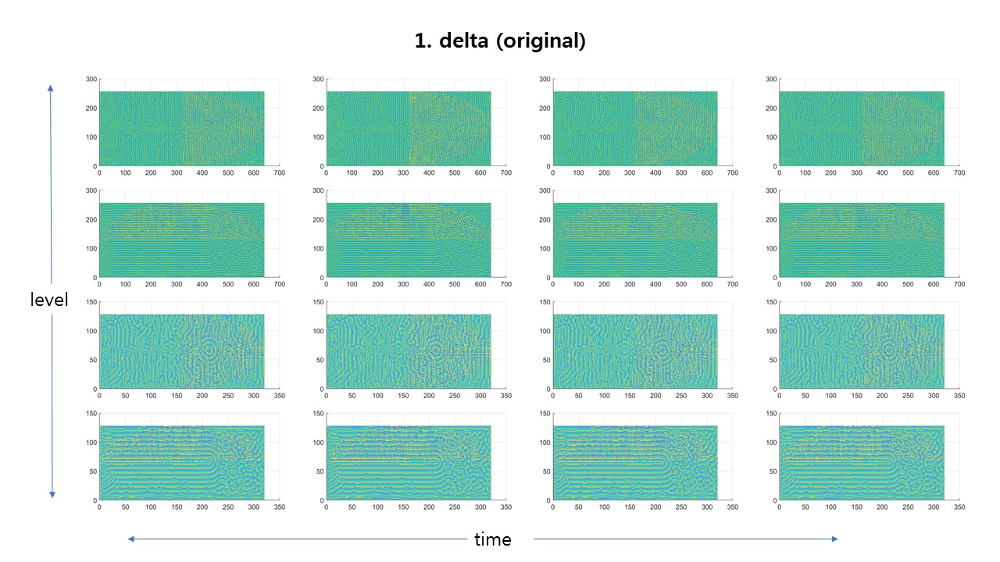

기준 프레임의 위상각 이미지를 생각해보면, **기준 프레임 - t번째 프레임**과 형상은 유사하지만 색의 대조는 좀 옅어졌다는 것을 알 수 있습니다. 가로축이 시간의 흐름에 따라 나열한 것임을 고려했을 때, 육안으로 보았을 때는 큰 차이가 없어보입니다. 여기서, level = 1, t = 1일 때의 데이터 상 캔틸레버가 위치한 h = 128부근의 w값을 플로팅하면 아래와 같습니다.

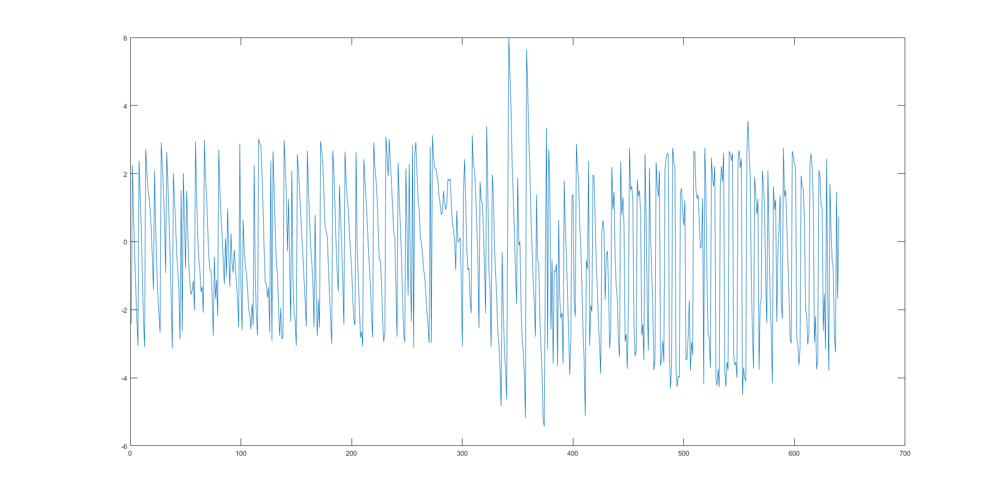

중앙 부근에 -3.14~3.14의 범주를 초과하는 값들이 있습니다. 해당 값들을 재조정하기 위해 **delta**에 모듈로 연산을 거친 다음의 데이터는 다음과 같습니다.

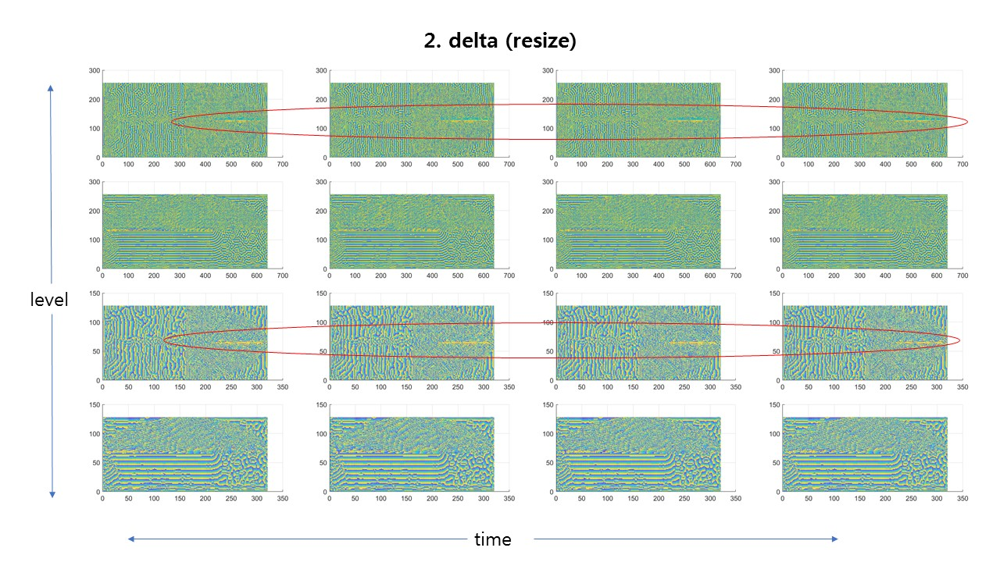

빨간색으로 표기된 부근은 다른 복잡한 형상들 가운데서도 두드러지게 일관된 값을 보이는 것으로 보입니다. 이는 실제 영상에서 캔틸레버의 진동이 위치하는 곳이므로, 그에 따른 양상이라 추측해볼 수 있습니다.




3.    **픽셀 변화 값에 대한 band pass filtering**: 위의 과정을 거친 연속적인 프레임들은 미소하게 진동하는 물체를 담은 영상이므로, 특정 몇 개의 픽셀에서는 값들이 아래와 같이 진동하는 양상을 보입니다. 픽셀 하나에서 나오는 연속된 값들의 나열을 하나의 신호라고 생각한다면, 특정한 주기에 대해 필터링을 할 수 있습니다.

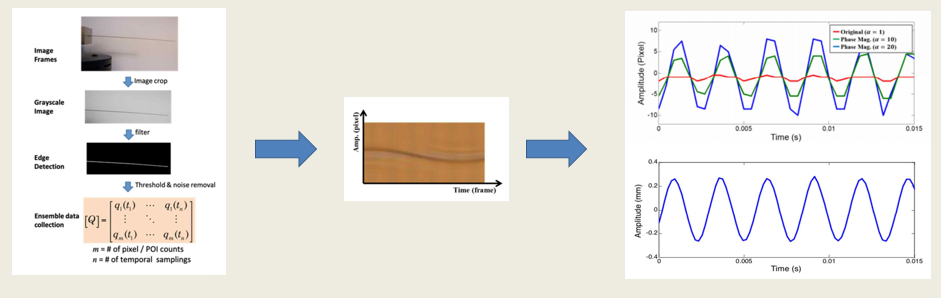

**delta**를 **fir_window_bp_2**함수에 적용하게 되면, 한 픽셀의 값이 시간의 흐름에 따라 나열된 1차원 데이터에 대해 FIR hamming window를 씌운 뒤 **LowFreq**와 **HighFreq**사이 대역에 해당되는 주파수 성분만을 남겨놓게 됩니다.

4.    **alpha 계수 곱 및 병합**: 지정된 주파수 대역의 성분만 남아있는 **delta**에 **alpha**계수를 곱해준 다음, 기존의 영상에 **steerable filter**를 씌운 영상과 컨볼루션합니다. 이로써 변화에 해당되는 **delta**가 **alpha**의 값만큼 가장된 다음 원본 영상에 적용됨으로써, 마지막에 iFFT를 거치며 확대처리가 된 영상을 얻을 것입니다.
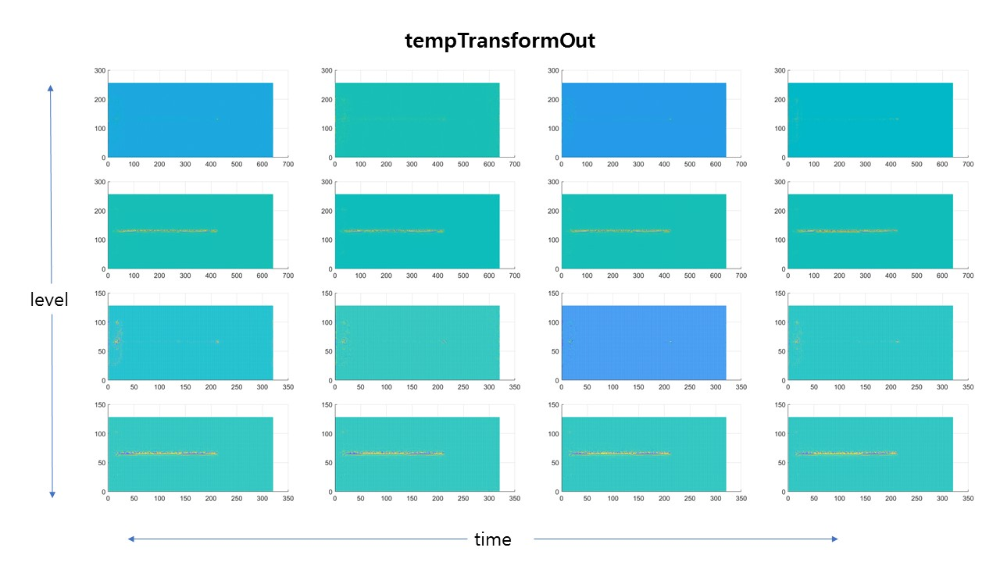
위의 일련을 과정을 거쳐서 얻는 것이 **tempTransformOut**입니다. 이를 다시 FFT 한 뒤 **magnifiedLumaFFT**에 누적합니다. **steerable fileter**는 같은 방향성 필터들의 경우, 그 필터들을 모두 합했을 때 전체 영역에 해당됩니다. 예를 들어 위의 filter[1]의 가운데 빈 공간은 filter[3]가 들어갈 수 있는 공간이며, filter[3] 가운데 빈 공간은 filter[5]가 들어갈 수 있습니다. 즉 각 필터들에 대해서 처리한 것을 모두 합해야 원본의 영상 그대로 복원할 수 있습니다.

5.    **lowpass residual 처리**: 모든 방향성 필터에 대해서 연산이 끝났다면, 마지막으로 Low Pass Filter를 거쳐 **magnifiedLumaFFT**에 더해줍니다.

# **05. 마무리 및 저장**

위의 과정을 통해 영상의 밝기에 해당하는 값들에 대해서 확대처리된 주파수 영역 이미지를 완성했습니다. 마지막으로 남은 일은 이를 역변환 해 확대처리된 회색조 영상을 얻고, 이에 YIQ변환에서 따로 빼두었던 색상정보와 재조합해서 복원하는 일입니다.

In [12]:
##########################Saving
cap_original = cv2.VideoCapture(fileName)

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
obj_out = cv2.VideoWriter('./output/(color) '+ str(Low_Freq) + '~' + str(High_Freq) + ', a=' + str(alpha) + ' {}.mp4'.format(videoName)
                          , fourcc, 30.0, (frameX, frameY))

ret, frame = cap_original.read()

for k in range(0, nFrame):
    clipMat1 = magnifiedLumaFFT[k]
    clipMat = ifft2(ifftshift(clipMat1))
    magnifiedLuma = np.real(clipMat)
    #명암에 대한 데이터만 적용하기 위해 yiq변환해서 Y 값만 가져온다.
    clipMat2 = bgr2yiq(frame)
    clipMat3 = magnifiedLuma*255
    clipMat2[:,:,0] = clipMat3
    
    #그 외의 Q, I는 그대로 사용할 것이므로 변환된 Y만 원본 영상에 대입한 뒤 다시 RGB로 변환한다.
    outFrame = yiq2bgr(clipMat2)
    
    outFrame[outFrame > 255] = 255
    outFrame[outFrame < 0] = 0
    outFrame = np.uint8(outFrame)
    obj_out.write(outFrame)
    ret, frame = cap_original.read()

cap_original.release()
obj_out.release()


우선 **magnifiedLumaFFT**를 IFFT 과정을 통해 **magnifiedLuma**를 만듭니다. 위에서 살펴보았듯 대부분의 복소수가 섞인 사진들은 실수부가 좀 더 픽셀간의 대조가 강조되므로 실수부만 취해준 뒤, 8bit unsigned integer의 크기에 맞게 리스케일링 해줍니다. 이로써 밝기에 해당되는 값을 얻은 다음, 원본 영상의 I, Q는 나둔뒤 Y값 부분을 **magnifiedLuma**로 대체해준 뒤 rgb 색좌표계 형태로 변환해줍니다. 이로써 PBM 알고리즘을 통해 확대처리된 영상을 얻을 수가 있습니다.